This notebook will be using the MLEnd London sounds dataset, to build a machine learning pipeline that takes an audio segment as an input and predicts whether the audio segment has been recorded indoors or outdoors.

In [ ]:
# loading the necessary libraries for the notebook
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.io import wavfile

import os, sys, re, pickle, glob
import urllib.request
import zipfile
import librosa
import zipfile
import IPython.display as ipd
from tqdm import tqdm


from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn import model_selection
from sklearn import svm
from sklearn.svm import SVC
%matplotlib inline

## Project Formulation
This project will be an end to end machine learning project which will be applying machine learning algorithms to classify audio signals as either being recorded indoors or outdoors.

## Machine Learning Pipeline
The input for this pipeline will be the audio segments from the MLEnd London sounds dataset, and the output will be a label which indicates whether this segment has been recorded indoors or outdoors.

The machine learning pipeline will be:

1. Data collection/extraction
2. Data preprocessing/cleaning
3. Feature extraction
4. Model fitting/training (multiple)
5. Visualisation and model evaluation (choosing the best model)

## Transformation Stage
Since audio files are complex data types (mostly time series or discrete signals) , a transformation stage is needed to make sense of the data. The MLEnd London sounds dataset consists of a collection of samples that are described by five attributes. These are: audio, area, spot, indoor/outdoor label, and the participant ID.

Since audio files have high dimensionality, we need to extract a few features to be able to train the model, and use these features as predictors. The following features will be extracted from the raw data: power, pitch (mean and standard deviation), and fraction of voiced region.

## Modelling
The following machine learning models have been chosen to be implemented to the data:

1. Support-Vector Machines (SVM) : A supervised machine learning algorithm that can be used for classification. The SVM classifier selects the hyper-plane which classifies the classes accurately prior to maximizing the margin between the classes. Tuning/changing the parameter for the SVM model greatly affects and improves the model accuracy and performance. We will be using the kernel RBF when applying the model, but we need to cross-validate its parameters so we avoid over-fitting. SVM is effective in high-dimensional spaces, and also works well when the number of dimensions is greater than the umber of samples, however, it does not perform well with a large data set.


2. Random Forest Classifier: It is a tree based algorithm, and is also a supervised machine learning algorithm. It works well with classification problems, and requires less data cleaning however, it does have a problem with over-fitting. But this problem can be overcome by pruning and setting constraints on the model parameters. It also uses two methods to ensure that the correlation between the models is low, the first is bagging and the second is feature randomness. The features we select and the hyper-parameters affects the correlation between the decision trees, and thus affects the performance of the model.


3. Ada Boost Classifier: The adabost classifier uses boosting which is a general ensemble method for creating strong classifiers from a number of weak classifiers. It was developed for binary classification, and so this could perform well for our binary classification.


4. Logistic Regression: logistic regression is a classification technique, which uses a logistic function to model the dependent variable, and it can only be used on binary classification.   


5. Decision Tree Classifier: the decision tree classifier builds a model by creating a decision tree. This means like the random forest classifier it is also a tree based algorithm. However, decision trees are prone to overfitting, this could cause an issue in interpretability.   


6. K-Nearest Neighbours (kNN): This is a non-parametric, supervised machine learning algorithm. It uses proximity as a basis for making classifications or predictions. However, even though this algorithm is versatile and simple to implement, it does get significantly slower the higher the number of predictors are.

After applying these models, we will assess their efficacy and accuracy in predicting whether an audio file has been recorded indoors or outdoors. These models were chosen because they are supervised learning models that are suitable for classification purposes and they can be applied to labeled data.  

## Methodology
After the data has been cleaned and preprocessed, we will explore and visualise the data. This is followed by feature extraction and then training and validating the models which is splitting the dataset into training, validation and testing files. The models will initially be applied to the training data, then the performance of the model will be assessed through using the validation data. The training and validation accuracy will be obtained for all models and then compared to choose the best performing model on our data and problem. A confusion matrix will be used as well to assess model performance.

## Dataset
The data that will be used is the MLEnd London sounds dataset, this will be loaded below.

In [ ]:
# loading the data
data_path = 'MLEnd_DataALL/*.wav'
MLEnd_data = glob.glob(data_path)

len(MLEnd_data)

2496

As we can see the length of the file is 2496, this corresponds to the number of samples/items in the dataset. It is not 2500 as some samples were corrupt/had no audio and were removed. This is explained and shown below.

In [ ]:
# listening to random files
for _ in range(5):
    n = np.random.randint(98)
    display(ipd.Audio(MLEnd_data[n]))

The code above extracts a few random files so we can hear and try to differentiate between indoor and outdoor filming spots.

Now we can load the csv file into a dataframe which corresponds to each audio files' area, spot, indoor/outdoor labels, and participant ID's.

In [ ]:
# loading the dataframe for the labels
MLEnd_df = pd.read_csv('MLEndLS.csv').set_index('file_id')
MLEnd_df

,area,spot,in_out,Participant
file_id,,,,
0001.wav,british,street,outdoor,S151
0002.wav,kensington,dinosaur,indoor,S127
0003.wav,campus,square,outdoor,S18
0004.wav,kensington,hintze,indoor,S179
0005.wav,campus,square,outdoor,S176
...,...,...,...,...
2496.wav,westend,trafalgar,outdoor,S151
2497.wav,campus,square,outdoor,S6
2498.wav,westend,national,indoor,S96


Since audio files are complex and cannot be inserted directly into a dataframe, we need to print out the contents of the folder that stores the audio files. And each name of the wav files correspond to one of the file_id entries in the MLEnd_df dataframe.

### Exploring and visualising the data

In [ ]:
# shows contents of folder that stores audio files
for file in MLEnd_data:
    file.split('/')[-1]

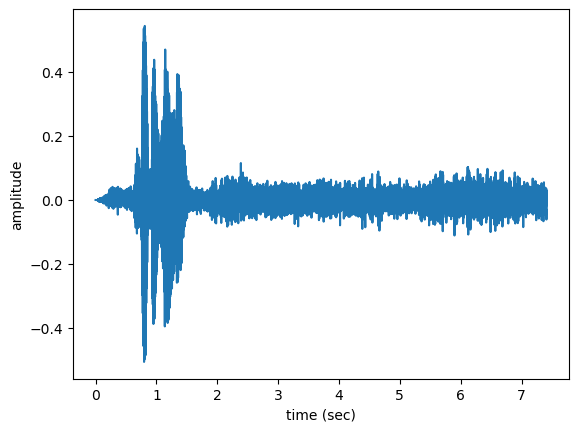

In [ ]:
# plot of one audio file
n = 0
fs = None # sampling frequency
x, fs = librosa.load(MLEnd_data[n],sr=fs)
t = np.arange(len(x))/fs
plt.plot(t,x)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')

# listening to the same audio file that is plotted
display(ipd.Audio(MLEnd_data[n]))

In [ ]:
n = 0
x, fs = librosa.load(MLEnd_data[n],sr=fs)
print('This audio signal has', len(x), 'samples')

This audio signal has 326781 samples


Before feature extraction, the data needs to be preprocessed and cleaned. Firstly, the MLEnd_df dataframe will be explored to check for inconsistencies or incorrect submissions.

In [ ]:
MLEnd_df['spot'].unique()

array(['street', 'dinosaur', 'square', 'hintze', 'piazza', 'upper',
       'canal', 'forecourt', 'greatcourt', 'reception', 'leicester',
       'waterloo', 'room12', 'pond', 'national', 'library', 'skate',
       'market', 'book', 'ground', 'charing', 'trafalgar', 'curve',
       'ritblat', 'bridge', 'marine', 'food', 'albert', 'cromwell',
       'gardens', 'royal', 'room13'], dtype=object)

The [spot] should correspond to specific areas, for example: the [british] area should correspond to the following spots: forecourt, greatcourt, room12, room23, street and square. In the [spot] data in the dataframe however, we can see there is a room 13, this does not correspond to any specific area, therefore this file will be excluded from both the dataframe and the MLEnd_data from the data file itself.

In [ ]:
# finding the corresponding file
whichfile = MLEnd_df[MLEnd_df['spot']=='room13']
whichfile

,area,spot,in_out,Participant
file_id,,,,
0762.wav,british,room13,indoor,S71


In [ ]:
# dropping the file from dataframe
MLEnd_df = MLEnd_df.drop('0762.wav')

In the next few cells, we will be extracting a few features which have been stated above.

In [ ]:
# function to extract the pitch from audio files
def getPitch(x, fs, winLen = 0.02):
    #winLen = 0.02
    p = winLen * fs
    frame_length = int(2**int(p-1).bit_length())
    hop_length = frame_length//2
    f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
    return f0,voiced_flag

The next function will create a numpy array by using the audio files we have with the csv dataframe. This array will contain four audio features that will be used as predictors (X), a binary label (y) will equal 1 when the recording is indoors and 0 when the recording is outdoors.

In [ ]:
# when running the algorithm below, it breaks on the wav files 2206, 0170 and 0033
# removing these files from labels df and data
MLEnd_df = MLEnd_df.drop('2206.wav')
MLEnd_df = MLEnd_df.drop('0170.wav')
MLEnd_df = MLEnd_df.drop('0033.wav')
MLEnd_df

,area,spot,in_out,Participant
file_id,,,,
0001.wav,british,street,outdoor,S151
0002.wav,kensington,dinosaur,indoor,S127
0003.wav,campus,square,outdoor,S18
0004.wav,kensington,hintze,indoor,S179
0005.wav,campus,square,outdoor,S176
...,...,...,...,...
2496.wav,westend,trafalgar,outdoor,S151
2497.wav,campus,square,outdoor,S6
2498.wav,westend,national,indoor,S96


In [ ]:
# function that creates a numpy array from audio file and csv dataframe created
def getXy(files,labels_file, scale_audio=False, onlySingleDigit=False):

    X, y =[],[]
    for file in tqdm(files):
        fileID = file.split('/')[-1]
        file_name = file.split('/')[-1]
        yi = labels_file.loc[fileID]['in_out']=='indoor'

        fs = None # if None, fs would be 22050
        x, fs = librosa.load(file, sr = fs)
        if scale_audio: x = x/np.max(np.abs(x))
        f0, voiced_flag = getPitch(x,fs,winLen=0.02)

        power = np.sum(x**2)/len(x)
        pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
        pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
        voiced_fr = np.mean(voiced_flag)


        xi = [power,pitch_mean,pitch_std,voiced_fr]
        X.append(xi)
        y.append(yi)

    return np.array(X),np.array(y)

In [ ]:
# applying the function to our data

X,y = getXy(MLEnd_data, labels_file = MLEnd_df, scale_audio=True, onlySingleDigit=True)

100%|██████████| 2496/2496 [39:28<00:00,  1.05it/s]  


In [ ]:
# to check the shape of the X and y
print('The shape of X is', X.shape)
print('The shape of y is', y.shape)
print('The labels vector is', y)

The shape of X is (2496, 4)
The shape of y is (2496,)
The labels vector is [False  True False ...  True  True False]


In [ ]:
# checking to see if the dataset is balanced
print(' The number of indoor recordings is ', np.count_nonzero(y))
print(' The number of outdoor recordings is ', y.size - np.count_nonzero(y))

 The number of indoor recordings is  1180
 The number of outdoor recordings is  1316


The number of indoor recordings is 1180, and the number of outdoor recordings is 1317, this means our dataset is not balanced. However, the difference between outdoor and indoor data is only a difference of around 137 files.

## Results
This section will explore the different models specified above.


### Model 1: Support-Vector Machines (SVM)

In [ ]:
# splitting dataset into training and validation sets

X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.3, random_state=321)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

# applying the SVM model
model  = svm.SVC(C=1, gamma='scale', random_state=42)
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.5340583858042358
Validation  Accuracy 0.5113484646194927
The support vectors are (1634, 4)


To see if our model would improve its accuracy with normalisation, the following cells will normalise the data and run the SVM model again

In [ ]:
mean = X_train.mean(0)
sd =  X_train.std(0)

X_train = (X_train-mean)/sd
X_val  = (X_val-mean)/sd

model  = svm.SVC(C=1,gamma='scale', random_state=42)
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.5975958786491128
Validation  Accuracy 0.5487316421895861
The support vectors are (1607, 4)


As we can see the training accuracy has improved from 0.53 to 0.60, however, the validation accuracy has not improved by much, it has went from 0.51 to 0.55. Therefore, we can say that normalisation does not have a significant effect on the accuracy of the model.

## Comparison of all models
* Model 2: Random Forest Classifier
* Model 3: Ada Boost Classifier
* Model 4: Logistic Regression
* Model 5: Decision Tree Classifier
* Model 6: K-Nearest Neighbours (kNN)

We will now compare all models, this is to reduce the code required instead of individually testing each model, we will combine it and run it through once to get the accuracy for the training and validation sets for all models. The datasets will be normalised before applying the models.

In [ ]:
mean = X_train.mean(0)
sd =  X_train.std(0)
X_train = (X_train-mean)/sd
X_val  = (X_val-mean)/sd
Models = [
                         RandomForestClassifier(),
                         AdaBoostClassifier(),
                         LogisticRegression(),
                         DecisionTreeClassifier(),
                         KNeighborsClassifier(),
                         SVC(kernel='rbf')
]
accuracy_scores = []
for model in Models:
    model.fit(X_train,y_train)
    score = model.score(X_val,y_val)
    yt_p = model.predict(X_train)
    model_name = type(model).__name__
    accuracy_scores.append((model_name,(f'{100*score:.2f}%'), np.mean(yt_p==y_train)))
accuracy_df = pd.DataFrame(accuracy_scores,columns=['Classification Model','Validation Accuracy', 'Training Accuracy'])
accuracy_df.sort_values(by = 'Validation Accuracy',axis = 0, ascending = True)

,Classification Model,Validation Accuracy,Training Accuracy
2,LogisticRegression,51.27%,0.522610
1,AdaBoostClassifier,52.74%,0.643961
3,DecisionTreeClassifier,53.27%,1.000000
0,RandomForestClassifier,53.94%,1.000000
4,KNeighborsClassifier,54.61%,0.701202
5,SVC,54.87%,0.597596


The classifiers above show an accuracy score of around 50% for all classification models, this is not a good score. This is equivalent to the probability of tossing a coin, which is not good for a classifier as it is only correct half of the time. The best classifier is the SVC algorithm, it has the highest accuracy of 55%.  And the worst performing algorithm was the logistic regression classifier with an accuracy score of 51.3%.

LR: 0.517471 (0.025728)
RF: 0.546654 (0.045471)
KNN: 0.516292 (0.057992)
CART: 0.514568 (0.035576)
AB: 0.545501 (0.044498)
SVM: 0.550046 (0.052868)


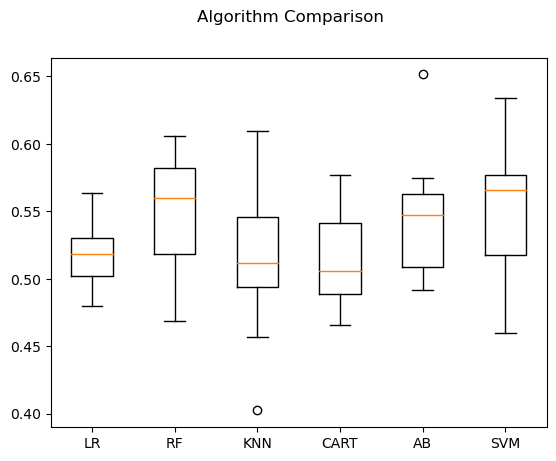

In [ ]:
# algorithm comparison boxplot

# prepare models
models = []
models.append(('LR', LogisticRegression()))
models.append(('RF', RandomForestClassifier()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('AB', AdaBoostClassifier()))
models.append(('SVM', SVC()))
# evaluate each model in turn like above
results = []
names = []
scoring = 'accuracy'
for name, model in models:
    kfold = model_selection.KFold(n_splits=10)
    cv_results = model_selection.cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    accuracies = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(accuracies)

fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

The box plot above shows the same information as in the table, and we can see that the highest classification model implemented is the SVM.  

## Conclusions

To conclude, the classifiers did not perform as expected and the results are not satisfactory as the highest tested algorithm had an accuracy score of around 55% only. This could be due to the number of features extracted, further extra features may have improved the results but it could have also lead to the the exclusion of a few classifiers that perform worse with higher dimensionality, and it could have also lead to over-fitting in some cases. While this result is not satisfactory in terms of the project, it is also not unexpected. This is because the audio files have a lot of noise and it would be difficult to be able to predict whether a recording is indoors or outdoors based on audio recordings even by humans. This is because not all outdoors recordings had for example high noise and amplitudes and not all indoor recordings were quiet and had low amplitudes. Therefore, using simple classification models would not have been likely to find a relationship between indoor/outdoor and audio features.

### Improvements

Improvements could be using more audio features and experimenting with different combinations of audio features for the highest accuracy. Further research and understanding of audio features would have also been useful for this project (i.e., what is MFCC and fraction of voiced region, etc.), to better understand which features could be best utilised for classification purposes. More tuning of the parameters could have also been employed to be able to test which hyperparameters are the best combination to achieve higher performance.

Since this notebook deals with the 'basic' classification, these simple models used were adequate in trying to classify the data since we wanted a binary output. If we wanted to use the models for multi-class classification purposes then it would have been different and the models would have to be more complex and some models would have to be opted out.